# End-to-End Dog-Cat Classification
This notebook builds an end-to-end binary-classification image classifier using TensorFlow and TensorFlow Hub.

## Problem
The goal of this project is to develop a machine learning model that can accurately classify images of cats and dogs. Given an image of a cat or a dog, the model should be able to predict whether the image is of a cat or a dog with a high degree of accuracy.

## Data
The data we will use is the Kaggle's Cats-vs-Dogs image dataset for binary classification from the following link:

https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset

## Evaluation
The evaluation is to maximize the accuracy to identify whether the given image is cat or dog.

## Features
Some Information about the data:
* We're dealing with images(unstructured data) so it's probably best to use deep learning/transfer learning.
* It is a binary calssification model (which means there are 2 different classes).
* There are around 10,000+ dog images.
* There are around 10,000+ cat images.


# Note: 
You can consider this project as two parts.
* In the first part, we will prepare a csv file which will contain the image id (name of the image) and its label(Cat or Dog).
* In the second part, we will read and work on the csv file, proceed the project and train a machine learning model.

# Part1
### Preparing the csv file

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import tensorflow as tf
from random import shuffle
import tensorflow_hub as hub

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Checking if all the images in the dataset are jpg images
from PIL import Image

# Set the paths to the directories containing the images
image_dirs = ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat', 
              'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog']

# Loop through each directory and each image file and print the names of any non-JPEG files
for image_dir in image_dirs:
    image_files = os.listdir(image_dir)
    for image_file in image_files:
        if not image_file.endswith('.jpg'):
            print(image_file)

In [ ]:
# Removing the files that are irrelevant
file_path = "drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/Thumbs.db"
file_path = "drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/Thumbs.db"
# check if the file exists before attempting to delete it
if os.path.isfile(file_path):
    # delete the file using the os.remove() function
    os.remove(file_path)
    print(f"{file_path} deleted successfully")
else:
    print(f"{file_path} does not exist")


drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/Thumbs.db does not exist


In [ ]:
cats = os.listdir('drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/')
all_jpg = all(filename.endswith('.jpg') for filename in cats)

if all_jpg:
    print('Proceed')
else:
    print('Stop')

Proceed


In [ ]:
dogs = os.listdir('drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/')
all_jpg = all(filename.endswith('.jpg') for filename in dogs)

if all_jpg:
    print('Proceed')
else:
    print('Stop')

Proceed


In [ ]:
cat_filenames = ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/' + fname for fname in os.listdir('drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/')]
dog_filenames = ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/' + fname for fname in os.listdir('drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/')]
cat_filenames[:5], dog_filenames[:5]

(['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9088.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9086.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9097.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9101.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/91.jpg'],
 ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9075.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9079.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9118.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9112.jpg',
  'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9103.jpg'])

In [ ]:
# Writing the function to delete the image paths that are in a format that TensorFlow cannot understand.
def delete_unsupported_image_paths(image_paths):
    """
    Deletes image paths that are in a format that TensorFlow cannot understand.
    Args:
        image_paths (list): A list of image paths.
    Returns:
        list: A list of remaining image paths after deleting unsupported paths.
    """
    supported_extensions = ['.jpg', '.jpeg']
    remaining_paths = []
    for path in image_paths:
        if not os.path.isfile(path):
            continue
        extension = os.path.splitext(path)[1].lower()
        if extension in supported_extensions:
            try:
                # Try loading the image with TensorFlow to see if it's supported
                tf.io.decode_image(tf.io.read_file(path))
                remaining_paths.append(path)
            except:
                # Delete the file if TensorFlow cannot decode it
                os.remove(path)
                print(f"Image {path} has been deleted successfully.")
    return remaining_paths

In [ ]:
cat_image_paths = cat_filenames
cat_remaining_paths = delete_unsupported_image_paths(cat_image_paths)
print("After deletion:", cat_remaining_paths)

After deletion: ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9088.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9086.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9097.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9101.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/91.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9093.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9102.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9099.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9096.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9082.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9094.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9103.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/909.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9085.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9098.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9129.jpg', 'drive/MyD

In [ ]:
# Example usage
dog_image_paths = dog_filenames
dog_remaining_paths = delete_unsupported_image_paths(dog_image_paths)
print("After deletion:", dog_remaining_paths)

After deletion: ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9075.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9079.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9118.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9112.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9103.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9106.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9100.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9104.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9105.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9109.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9116.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9113.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/91.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9111.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9108.jpg', 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9119.jpg', 'drive/My

In [ ]:
cat_filenames = [os.path.splitext(os.path.basename(path))[0] for path in cat_image_paths]
cat_ids = [filename.split('.')[0] for filename in cat_filenames]


dog_filenames = [os.path.splitext(os.path.basename(path))[0] for path in dog_image_paths]
dog_ids = [filename.split('.')[0] for filename in dog_filenames]

len(cat_ids), len(dog_ids)


(12441, 12381)

In [ ]:
cat_ids[:5]

['9088', '9086', '9097', '9101', '91']

In [ ]:
df = pd.DataFrame({'ID': cat_ids, 'Label': 'Cat'})
df2 = pd.DataFrame({'ID': dog_ids, 'Label': 'Dog'})
combined = [df, df2]
data_frame = pd.concat(combined, ignore_index = True)
data_frame.head()

,ID,Label
0,9088,Cat
1,9086,Cat
2,9097,Cat
3,9101,Cat
4,91,Cat


In [ ]:
data_frame['Label'].isnull().sum()

0

In [ ]:
data_frame['ID'].isnull().sum()

0

In [ ]:
data_frame.loc[[12555]]

,ID,Label
12555,9198,Dog


In [ ]:
data_frame.loc[[12556]]

,ID,Label
12556,9199,Dog


In [ ]:
data_frame.tail()

,ID,Label
24817,10330,Dog
24818,10341,Dog
24819,10342,Dog
24820,10352,Dog
24821,10349,Dog


In [ ]:
data_frame['Label'][12555], data_frame['Label'][12556]

('Dog', 'Dog')

In [ ]:
# Shuffling the data
data_frame = data_frame.sample(frac = 1)

In [ ]:
len(data_frame)

24822

In [ ]:
data_frame.to_csv('drive/MyDrive/Dogs-vs-Cats/dataset/Labels.csv', index = False)

# Part2
### Reading the csv file and proceed the project accordingly

In [ ]:
labels_csv = pd.read_csv('drive/MyDrive/Dogs-vs-Cats/dataset/Labels.csv')
labels_csv.head(10)

,ID,Label
0,9524,Cat
1,4319,Cat
2,11830,Cat
3,5798,Dog
4,6084,Dog
5,9677,Cat
6,5933,Cat
7,11102,Dog
8,9434,Cat
9,6513,Dog


In [ ]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24822 entries, 0 to 24821
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   ID      24822 non-null  object
 1   Label   24822 non-null  object
dtypes: object(2)
memory usage: 388.0+ KB


In [ ]:
labels_csv.describe()

,ID,Label
count,24822,24822
unique,12565,2
top,9524,Cat
freq,2,12441


In [ ]:
labels_csv['Label'].value_counts()

Cat    12441
Dog    12381
Name: Label, dtype: int64

<Axes: >

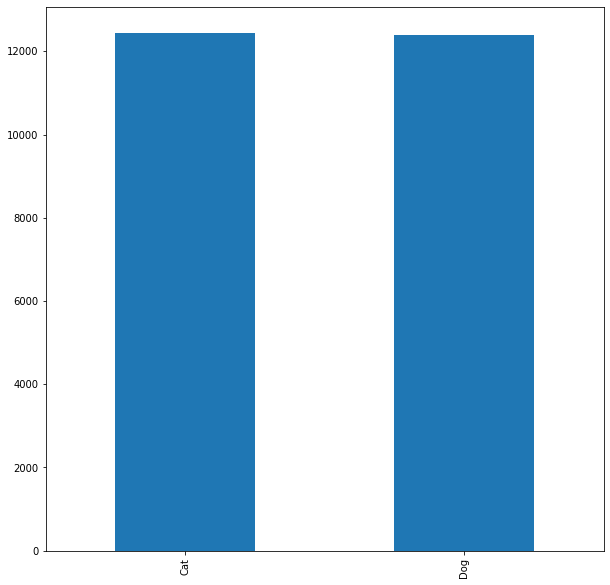

In [ ]:
labels_csv['Label'].value_counts().plot.bar(figsize = (10,10))

In [ ]:
filenames = ['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/' + fname + '.jpg' if labels_csv.loc[i, 'Label'] == "Cat" else 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/' + fname + '.jpg' for i, fname in labels_csv['ID'].items()]
len(filenames)

24822

In [ ]:
filenames[:10]

['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9524.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/4319.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/11830.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/5798.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/6084.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9677.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/5933.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/11102.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9434.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/6513.jpg']

In [ ]:
type(filenames)

list

In [ ]:
filenames[12550:12557]

['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/6012.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/3172.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/8972.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/7434.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9972.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/4607.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/6015.jpg']

In [ ]:
filenames[12550:12560]

['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/6012.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/3172.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/8972.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/7434.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/9972.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/4607.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/6015.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/8494.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/12033.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/7949.jpg']

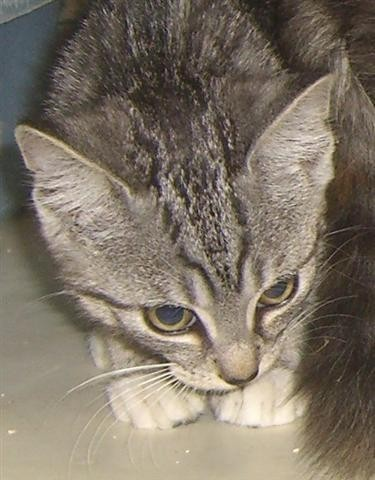

In [ ]:
from IPython.display import Image
Image(filenames[12556])

In [ ]:
labels_csv['Label'][12556]

'Cat'

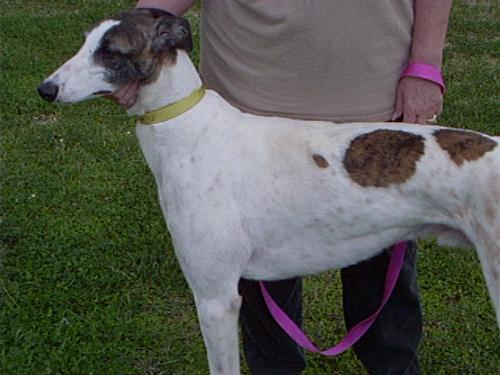

In [ ]:
Image(filenames[12567])

In [ ]:
labels_csv['Label'][12567]

'Dog'

In [ ]:
labels = labels_csv['Label'].to_numpy()
len(labels)

24822

In [ ]:
if len(labels)==len(filenames):
  print('Proceed')
else:
  print('Stop')

Proceed


In [ ]:
unique_labels = np.unique(labels)
unique_labels

array(['Cat', 'Dog'], dtype=object)

# Turning data labels (Labels) into numbers

In [ ]:
filenames[0]

'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/9524.jpg'

In [ ]:
labels[0] == unique_labels

array([ True, False])

In [ ]:
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[12550:12560]

[array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([False,  True]),
 array([ True, False])]

## Creating the Validation dataset
Since there is no validation set we'll prepare our own.


In [ ]:
# Setup X and y
X = filenames
y = boolean_labels

In [ ]:
# Reducing the images to ~1000 for experimentation
NUM_IMAGES = 1000
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:1000],
                                                  y[:1000],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(y_train), len(X_val),  len(y_val)

(800, 800, 200, 200)

## Converting images into Tensors

In [ ]:
from matplotlib.pyplot import imread
image = imread(X_train[0])
image.shape

(354, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(354, 350, 3), dtype=uint8, numpy=
array([[[149, 155, 155],
        [150, 156, 156],
        [150, 156, 156],
        ...,
        [122, 126, 125],
        [122, 126, 125],
        [122, 126, 125]],

       [[149, 155, 155],
        [150, 156, 156],
        [150, 156, 156],
        ...,
        [122, 126, 125],
        [122, 126, 125],
        [122, 126, 125]],

       [[149, 155, 155],
        [150, 156, 156],
        [150, 156, 156],
        ...,
        [122, 126, 125],
        [122, 126, 125],
        [122, 126, 125]],

       ...,

       [[ 21,  23,  18],
        [ 23,  25,  20],
        [ 26,  28,  23],
        ...,
        [119, 120, 124],
        [108, 109, 113],
        [102, 103, 107]],

       [[ 16,  23,  16],
        [ 16,  23,  16],
        [ 20,  27,  20],
        ...,
        [ 83,  79, 102],
        [ 76,  72,  99],
        [ 73,  68, 100]],

       [[ 16,  23,  16],
        [ 16,  23,  16],
        [ 20,  27,  20],
        ...,
        [ 55,  51,  7

In [ ]:
X_train[:10]

['drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/2201.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/3526.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/3562.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Dog/11479.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/3551.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/10922.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/4129.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/11957.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/10394.jpg',
 'drive/MyDrive/Dogs-vs-Cats/dataset/PetImages/Cat/6194.jpg']

### Function which will do the following:
* Take an image filepath as input
* Use Tensorflow to read the file and save it to a variable image
* Turn our image (a jpg image) into Tensors
* Normalization: Covert the color channel values from 0-255 to 0-1.
* Resize image to a shape of (224,224)
* Return the modified image

In [ ]:
IMG_SIZE = 224  # we are using 224 because most of deep learning model work with it
def process_image(image_path):
    # Read in an image file
    image = tf.io.read_file(image_path)
    # Decode the image (supports BMP, GIF, JPEG, PNG)
    image = tf.image.decode_jpeg(image, channels=3)
    # Covert the color channel values from 0-255 to 0-1
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to (IMG_SIZE, IMG_SIZE)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    # Return the modified image
    return image

# Converting our data into Batches

In [ ]:
# Creating a simple function to return the tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label


In [ ]:
# Using the above process_image function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3277751 , 0.29248098, 0.30424568],
         [0.3081758 , 0.27288166, 0.28464636],
         [0.27387196, 0.23857786, 0.25034255],
         ...,
         [0.39194557, 0.5168055 , 0.3207271 ],
         [0.31116953, 0.43665975, 0.24970247],
         [0.33436683, 0.45985705, 0.27452835]],
 
        [[0.24200806, 0.20671394, 0.21847865],
         [0.23174232, 0.1964482 , 0.20821291],
         [0.22223571, 0.18694158, 0.19870628],
         ...,
         [0.3568995 , 0.4863113 , 0.27846813],
         [0.38452595, 0.5100599 , 0.31385016],
         [0.38441145, 0.50991845, 0.31617856]],
 
        [[0.2172444 , 0.18195029, 0.19371499],
         [0.20639007, 0.17109594, 0.18286066],
         [0.21950868, 0.18421455, 0.19597927],
         ...,
         [0.36305737, 0.49246916, 0.284626  ],
         [0.38988972, 0.5193015 , 0.31064248],
         [0.37797496, 0.50662637, 0.29900077]],
 
        ...,
 
        [[0.06824088, 0.08392716

In [ ]:
type(X_train)

list

In [ ]:
# Define the batch size, 32 is a good to start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data = False): 
  # y=None as we don't need labels
  """
  Creates batches of data out of image X and label y pairs.
  Shuffles the data if it's training data but doesn't shuffle the data if it is validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is test dataset, we probably don't have labels
  if test_data:
    # As there are no labels in test data so we will process_image but as there are labels in valid and train we will convert them into tuple and process_image
    print('Creating test data batches.....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is valid dataset, we don't need to shuffle it
  if valid_data:
    print('Creating valid data batches.....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    # if the data is train dataset, we have to shuffle it
    print('Creating train data batches.....')
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor funtion is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))   # buffer size means how much data do you want to shuffle
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating the data batches of our data
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data = True)

Creating train data batches.....
Creating valid data batches.....


In [ ]:
# Check out the different attributes of data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

In [ ]:
# Defining a function to display 25 images
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis('off')


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

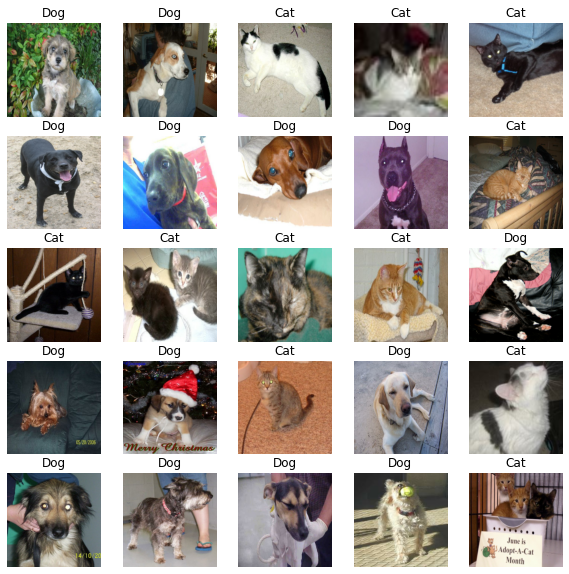

In [ ]:
# Displaying the images
show_25_images(train_images, train_labels)

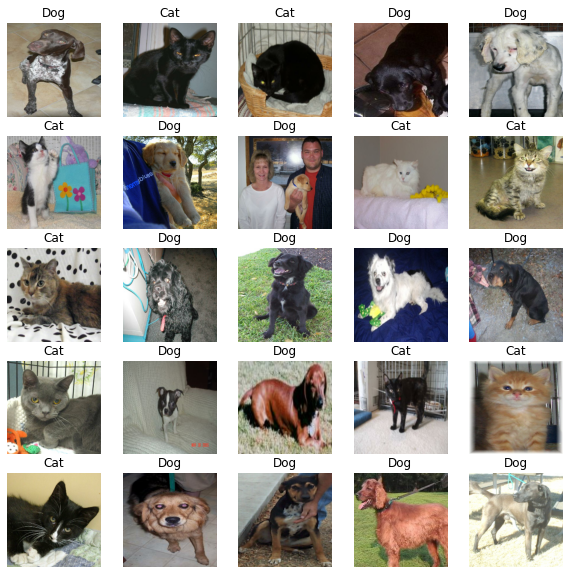

In [ ]:
# As there is no shuffling in case of validation so we will see the same image every time
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) to our model.
* The URL of our model we want to use from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_075_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_075_224/classification/5'

Now we've inputs, outputs and model ready to go. Let's put them all together into a Keras deep learning model! Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in Keras model in a sequential fashion (do first this, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model
All of these steps are found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Creates a function which builds a Keras Model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with: ', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([    
      hub.KerasLayer(MODEL_URL),  
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = 'sigmoid') 
  ])  

  # Compile the model
  model.compile(
      loss = tf.keras.losses.BinaryCrossentropy(), 
      optimizer = tf.keras.optimizers.Adam(), 
      metrics = ['accuracy']  
  )

  # Build the model
  model.build(INPUT_SHAPE) 

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_075_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              2664345   
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 2,666,349
Trainable params: 2,004
Non-trainable params: 2,664,345
_________________________________________________________________


# Creating Callbacks

## TensorBoard Callback
To setup a TensorBoard Callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Loading the TensorBoard extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  # Creating a directory to store the logs of the tensorboard callback
  logdir = os.path.join('drive/MyDrive/Dogs-vs-Cats/logs',
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Creating early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

In [ ]:
NUM_EPOCHS = 100

In [ ]:
# Checking if the GPU is working or not
print('Working' if tf.config.list_logical_devices('GPU') else 'Not Working')

Working


### Let's create a function which will train the model:
* Creates a model using `create_model` function
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit function on our model passing it the training data, validation data, number of epochs to train for and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and return the trained model
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data, 
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq = 1, # how many times we want to know our model learn the patterns from training data,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_075_224/classification/5
Epoch 1/100
25/25 [==============================] - 23s 566ms/step - loss: 0.3295 - accuracy: 0.8850 - val_loss: 0.1286 - val_accuracy: 0.9650
Epoch 2/100
25/25 [==============================] - 5s 186ms/step - loss: 0.1041 - accuracy: 0.9737 - val_loss: 0.0869 - val_accuracy: 0.9750
Epoch 3/100
25/25 [==============================] - 3s 114ms/step - loss: 0.0693 - accuracy: 0.9800 - val_loss: 0.0749 - val_accuracy: 0.9800
Epoch 4/100
25/25 [==============================] - 3s 112ms/step - loss: 0.0523 - accuracy: 0.9875 - val_loss: 0.0695 - val_accuracy: 0.9800
Epoch 5/100
25/25 [==============================] - 3s 111ms/step - loss: 0.0420 - accuracy: 0.9962 - val_loss: 0.0638 - val_accuracy: 0.9800
Epoch 6/100
25/25 [==============================] - 4s 149ms/step - loss: 0.0349 - accuracy: 0.9962 - val_loss: 0.0593 - val_accuracy: 0.9800


# Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.


In [ ]:
%tensorboard --logdir drive/MyDrive/Dogs-vs-Cats/logs
# x-axis is number of epochs and y-axis is accuracy of training and validation

<IPython.core.display.Javascript object>

In [ ]:
valid_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

## Making Predictions

In [ ]:
predictions = model.predict(valid_data, verbose = 1)
predictions

7/7 [==============================] - 1s 70ms/step


array([[3.27411182e-02, 8.65886688e-01],
       [9.98990953e-01, 1.25211733e-03],
       [9.69246030e-01, 1.92339569e-02],
       [3.28795461e-04, 9.99893785e-01],
       [2.70890575e-02, 9.78711426e-01],
       [9.98021126e-01, 7.18418858e-04],
       [6.36954734e-04, 9.99766171e-01],
       [9.97915119e-02, 9.93716776e-01],
       [9.99701679e-01, 9.78882425e-04],
       [9.98673320e-01, 4.53892490e-03],
       [9.95644331e-01, 9.32078518e-04],
       [7.73187935e-01, 6.05515897e-01],
       [1.92164874e-03, 9.98463988e-01],
       [3.49165723e-02, 9.64877903e-01],
       [9.84444469e-03, 9.90818560e-01],
       [9.99748766e-01, 1.72832559e-04],
       [9.55163850e-04, 9.95671630e-01],
       [7.60830045e-02, 9.74565208e-01],
       [9.97005284e-01, 6.39861077e-03],
       [9.97092247e-01, 1.79643731e-03],
       [9.99681830e-01, 4.88209771e-04],
       [3.59942816e-04, 9.99302983e-01],
       [5.56674902e-04, 9.99981642e-01],
       [3.77845138e-01, 7.73332477e-01],
       [2.070155

In [ ]:
predictions.shape

(200, 2)

In [ ]:
# How the shape relates
len(y_val), len(unique_labels)

(200, 2)

In [ ]:
import numpy as np
# Demo
index =  0

print(f'Max Value (Probability of Predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max Index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {unique_labels[np.argmax(predictions[index])]}')

Max Value (Probability of Predictions): 0.8658866882324219
Sum: 0.8986278176307678
Max Index: 1
Predicted Label: Dog


In [ ]:
# Turn prediction probablities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_labels[np.argmax(prediction_probabilities)]

In [ ]:
pred_label = get_pred_label(predictions[45])
pred_label

'Cat'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on validation images and then compare those predictions to the validation labels (true labels).

First we'll do it without function then we'll convert it into the function.

In [ ]:
# Without Function
images_ = []
labels_ = []

for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.47728243, 0.45375302, 0.3674785 ],
         [0.4752996 , 0.4517702 , 0.36549565],
         [0.47450984, 0.45098042, 0.3647059 ],
         ...,
         [0.4648784 , 0.441349  , 0.35507447],
         [0.46812847, 0.44459906, 0.35832453],
         [0.47126004, 0.44773063, 0.3614561 ]],
 
        [[0.46396187, 0.4365109 , 0.36200106],
         [0.4722894 , 0.44483843, 0.37032863],
         [0.48094365, 0.45349267, 0.37898287],
         ...,
         [0.47498152, 0.4514521 , 0.36517757],
         [0.47482207, 0.45129266, 0.36501813],
         [0.47510508, 0.45157567, 0.36530113]],
 
        [[0.47215515, 0.44407392, 0.37443104],
         [0.47903436, 0.45095316, 0.38131028],
         [0.485841  , 0.45775977, 0.38811693],
         ...,
         [0.4901961 , 0.4666667 , 0.3803922 ],
         [0.4903614 , 0.46683198, 0.38055748],
         [0.49381134, 0.47028193, 0.38400742]],
 
        ...,
 
        [[0.67903894, 0.6711958 , 0.624137  ],
         [0.6524607 , 0.6408886 , 0.59569

In [ ]:
get_pred_label(predictions[0]), get_pred_label(labels_[0]) # If same the result is true

('Dog', 'Dog')

In [ ]:
# Using Function
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.47728243, 0.45375302, 0.3674785 ],
         [0.4752996 , 0.4517702 , 0.36549565],
         [0.47450984, 0.45098042, 0.3647059 ],
         ...,
         [0.4648784 , 0.441349  , 0.35507447],
         [0.46812847, 0.44459906, 0.35832453],
         [0.47126004, 0.44773063, 0.3614561 ]],
 
        [[0.46396187, 0.4365109 , 0.36200106],
         [0.4722894 , 0.44483843, 0.37032863],
         [0.48094365, 0.45349267, 0.37898287],
         ...,
         [0.47498152, 0.4514521 , 0.36517757],
         [0.47482207, 0.45129266, 0.36501813],
         [0.47510508, 0.45157567, 0.36530113]],
 
        [[0.47215515, 0.44407392, 0.37443104],
         [0.47903436, 0.45095316, 0.38131028],
         [0.485841  , 0.45775977, 0.38811693],
         ...,
         [0.4901961 , 0.4666667 , 0.3803922 ],
         [0.4903614 , 0.46683198, 0.38055748],
         [0.49381134, 0.47028193, 0.38400742]],
 
        ...,
 
        [[0.67903894, 0.6711958 , 0.624137  ],
         [0.6524607 , 0.6408886 , 0.59569

Now we've got the ways to get:
* Prediction Labels
* Validation Labels (True Labels)
* Validation Images

Let's make a function to make all these more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title to red if the prediction is wrong and green if the prediction is right
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label
                                    ),
            color = color)

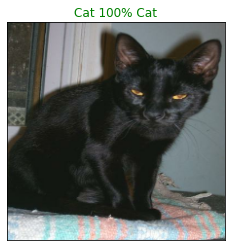

In [ ]:
plot_pred(predictions, val_labels, val_images)

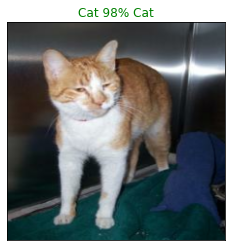

In [ ]:
plot_pred(predictions, val_labels, val_images, n = 45)

Now we've a function to visualize the top predictions of our model, let's make another function to view our model's predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the predictions:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the prediction probability values and labels, coloring the truth label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_pred_indexes = pred_prob.argsort()[-2:][::-1]

  top_pred_values = pred_prob[top_pred_indexes]

  top_pred_labels = unique_labels[top_pred_indexes]

  # Plot Setup
  top_plot = plt.bar(np.arange(len(top_pred_labels)),
                     top_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_pred_labels)),
             labels=top_pred_labels,
             rotation="vertical")
  
  if np.isin(true_label , top_pred_labels):
    top_plot[np.argmax(top_pred_labels==true_label)].set_color('green')
  else:
    pass

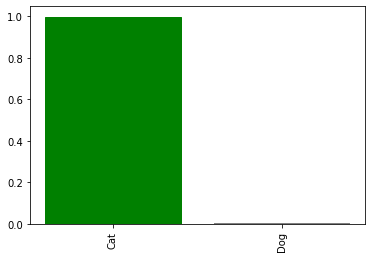

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

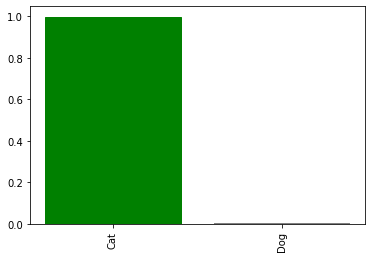

In [ ]:
plot_pred_conf(predictions, val_labels, n=43)

Now we've some functions to help us visualize our predictions and evaluate our model, let's check out a few.

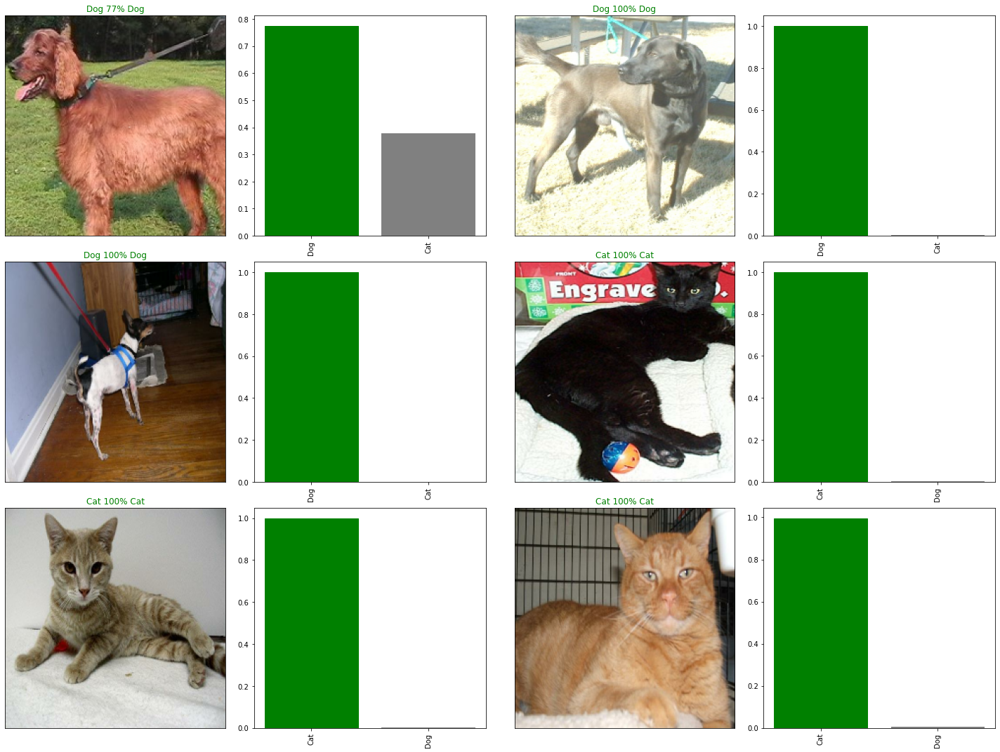

In [ ]:
# Basically this is combining two function's functionality plot_pred and plot_pred_conf
i_multiplier = 23
num_cols = 2
num_rows = 3
num_imgs = num_rows * num_cols

plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_imgs):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n = i + i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n = i + i_multiplier)

plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and Reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix):
  # create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Dogs-vs-Cats/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model at: {model_path}')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load trained model
def load_model(model_path):
  print(f'Loading saved model from {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer': hub.KerasLayer}
                                     )
  return model

Now we've got functions to save and load trained model, let's make sure the functions are working.

In [ ]:
# Saving our model trained on 1000 images
save_model(model, suffix = '1000_images-mobilenetv2-Adam')

Saving model at: drive/MyDrive/Dogs-vs-Cats/models/20230317-14101679062254-1000_images-mobilenetv2-Adam.h5


'drive/MyDrive/Dogs-vs-Cats/models/20230317-14101679062254-1000_images-mobilenetv2-Adam.h5'

In [ ]:
# Load trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dogs-vs-Cats/models/20230317-14101679062254-1000_images-mobilenetv2-Adam.h5')
# According to documentation warnigns can be ignored so will ignore them

Loading saved model from drive/MyDrive/Dogs-vs-Cats/models/20230317-14101679062254-1000_images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model (before the model was saved)
model.evaluate(valid_data)

7/7 [==============================] - 1s 83ms/step - loss: 0.0593 - accuracy: 0.9800


[0.05927378684282303, 0.9800000190734863]

In [ ]:
# Evaluate the saved model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 1s 76ms/step - loss: 0.0593 - accuracy: 0.9800


[0.05927378684282303, 0.9800000190734863]

# Training model on full dataset

In [ ]:
len(X), len(y)

(24822, 24822)

In [ ]:
full_data = create_data_batches(X, y)
full_data

Creating train data batches.....


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_075_224/classification/5


In [ ]:
# Creating full_model's callbacks
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(patience = 3, monitor = 'accuracy')

In [ ]:
full_model.fit(x = full_data,
               epochs  = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
776/776 [==============================] - 2732s 4s/step - loss: 0.0664 - accuracy: 0.9774
Epoch 2/100
776/776 [==============================] - 73s 94ms/step - loss: 0.0412 - accuracy: 0.9860
Epoch 3/100
776/776 [==============================] - 72s 92ms/step - loss: 0.0374 - accuracy: 0.9867
Epoch 4/100
776/776 [==============================] - 72s 93ms/step - loss: 0.0358 - accuracy: 0.9872
Epoch 5/100
776/776 [==============================] - 72s 93ms/step - loss: 0.0333 - accuracy: 0.9878
Epoch 6/100
776/776 [==============================] - 73s 94ms/step - loss: 0.0330 - accuracy: 0.9880
Epoch 7/100
776/776 [==============================] - 74s 96ms/step - loss: 0.0306 - accuracy: 0.9894
Epoch 8/100
776/776 [==============================] - 72s 93ms/step - loss: 0.0311 - accuracy: 0.9888
Epoch 9/100
776/776 [==============================] - 73s 94ms/step - loss: 0.0297 - accuracy: 0.9892
Epoch 10/100
776/776 [==============================] - 73s 94ms/step - l

In [ ]:
# Saving the full model
save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adam')

Saving model at: drive/MyDrive/Dogs-vs-Cats/models/20230317-16001679068809-full-image-set-mobilenetv2-Adam.h5


'drive/MyDrive/Dogs-vs-Cats/models/20230317-16001679068809-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dogs-vs-Cats/models/20230317-16001679068809-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from drive/MyDrive/Dogs-vs-Cats/models/20230317-16001679068809-full-image-set-mobilenetv2-Adam.h5


# Making predcitions on custom images
To make predictions on our custom images we'll:
* Get the filepath of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we'll set the `test_data` parameter to True.
* Pass the custom image data batch to our model's `predict` method.
* Convert the prediction's output probabilities to prediction labels.
* Compare the predicted label to custom images.

In [ ]:
# Get custom image filepaths
custom_path = 'drive/MyDrive/Dogs-vs-Cats/custom-images/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dogs-vs-Cats/custom-images/3c.jpg',
 'drive/MyDrive/Dogs-vs-Cats/custom-images/1d.jpg',
 'drive/MyDrive/Dogs-vs-Cats/custom-images/2d.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches.....


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 404ms/step


In [ ]:
custom_preds.shape

(3, 2)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['Cat', 'Dog', 'Dog']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

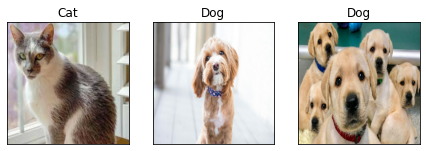

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)